In [10]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import pynapple as nap
import pandas as pd

def load_bin(filename: Path) -> np.memmap:
    dtype = np.dtype("int16")
    n_channels = 384
    n_values = filename.stat().st_size // dtype.itemsize
    assert n_values % n_channels == 0

    n_samples = n_values // n_channels
    return np.memmap(
        filename=filename,
        dtype=dtype,
        mode="r",
        shape=(n_samples, n_channels),
        order="C",
    )

fs = 1250.0
data_path = Path('/Volumes/fsmresfiles/Basic_Sciences/Phys/SenzaiLab/Elissa_Belluccini/Kilosort/Mouse10_20260210_795to2220/ProbeA')
ks_path = data_path / 'kilosort'

### Load a channel with gamma oscillations from LFP

In [ ]:
data = load_bin(data_path / "eeg" / "eeg.dat")

channel = 100
ch = np.asarray(data[:, channel])
t = np.arange(0, len(ch) / fs, 1/fs)
tsd = nap.Tsd(t=t, d=ch)
tsd

Time (s)
---------------------  ----
0.0                    2817
0.0008                 2754
0.0016                 2692
0.0024000000000000002  2864
0.0032                 2833
0.004                  2614
0.0048000000000000004  2645
...
36392.1512             4116
36392.152              4319
36392.1528             4617
36392.153600000005     4992
36392.1544             5133
36392.1552             5118
36392.156              5024
dtype: int16, shape: (45490196,)

### Load units and convert to TsGroup

In [11]:
from tools.io import load_units_metadata

units = load_units_metadata(data_path / 'kilosort')
spike_times = np.load(ks_path / 'spike_times.npy')
spike_clusters = np.load(ks_path / 'spike_clusters.npy')

In [12]:
data = {}
for uid in units.index:
    mask = spike_clusters == uid
    data[uid] = nap.Ts(spike_times[mask] / 30_000)
tsg = nap.TsGroup(data, metadata=units)

In [ ]:
tsg

Index    rate      cluster_id    Amplitude    ContamPct    KSLabel    amp      ch    ...
-------  --------  ------------  -----------  -----------  ---------  -------  ----  -----
18       1.2492    18            21.7         16.0         good       1145.09  230   ...
23       0.58914   23            24.2         0.0          good       1156.37  237   ...
26       2.639     26            10.4         16.6         good       637.22   238   ...
29       0.6971    29            23.9         0.0          good       1542.48  238   ...
32       10.16587  32            16.7         17.0         good       879.74   238   ...
38       0.59557   38            29.3         0.0          good       1780.85  293   ...
44       2.38027   44            13.2         1.5          good       1001.31  294   ...
...      ...       ...           ...          ...          ...        ...      ...   ...
1043     3.85185   1057          nan          nan          nan        1512.4   53    ...
1044     19.80289  

### Instantenous Phase

In [ ]:
if Path("../.tmp/gamma.npz").exists():
    gamma = nap.load_file("../.tmp/gamma.npz")
else:
    gamma = nap.apply_bandpass_filter(tsd, cutoff=(45, 65), fs=fs)
    gamma.save('../.tmp/gamma.npz')
gamma

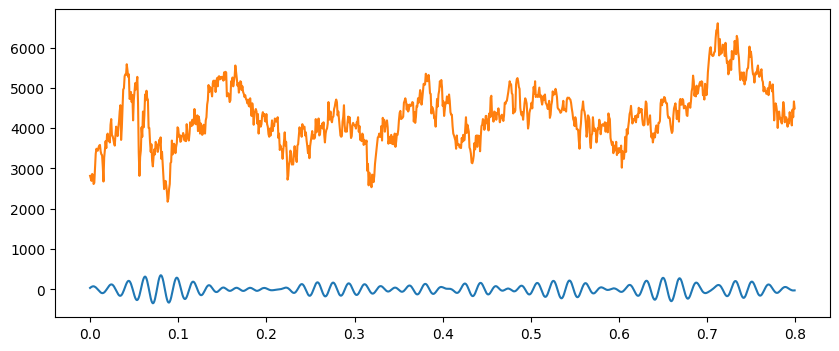

In [24]:
f, a = plt.subplots(figsize=(10, 4))
a.plot(gamma[:1000])
a.plot(tsd[:1000])

In [7]:
gphase = nap.compute_hilbert_phase(gamma)
gphase

Time (s)
----------  ---------
0.0         5.26917
0.0008      5.6309
0.0016      5.83796
0.0024      6.11108
0.0032      0.0292382
0.004       0.282519
0.0048      0.488057
...
36392.1512  4.71214
36392.152   4.61744
36392.1528  4.64643
36392.1536  4.64908
36392.1544  4.66906
36392.1552  4.67205
36392.156   4.69135
dtype: float64, shape: (45490196,)

### Phase coupling

In [42]:
phase_mod = nap.compute_tuning_curves(
    data=tsg,
    features=gphase,
    bins=61,
    range=(0, 2 * np.pi),
    feature_names=['gamma_phase']
)

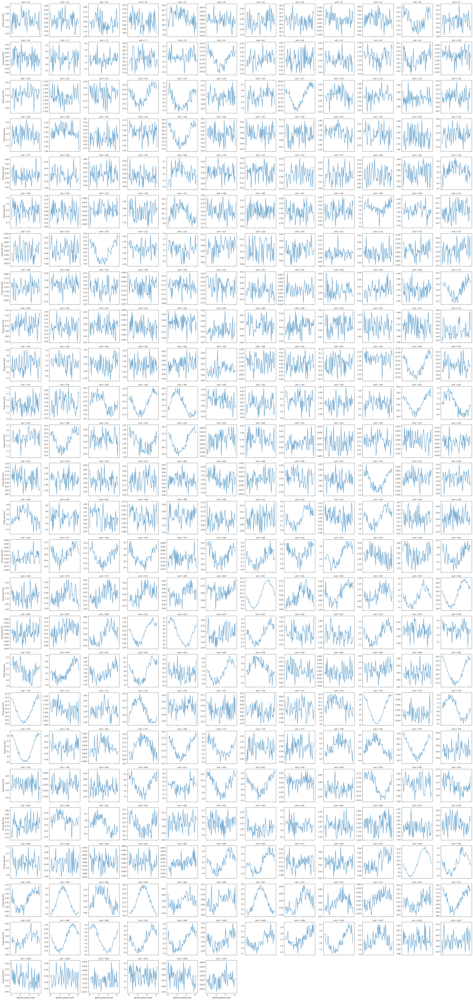

In [43]:
phase_mod.name = 'firing rate'
phase_mod.attrs['units'] = 'Hz'
phase_mod.coords['gamma_phase'].attrs['unit'] = 'rad'
phase_mod.plot(row='unit', col_wrap=12, sharey=False)

### Compute mean resultant length vector

In [209]:
z = (phase_mod * np.exp(1j * phase_mod.coords['gamma_phase'])).sum(dim='gamma_phase') / phase_mod.sum(dim='gamma_phase')
z = z.to_numpy()
z_length = np.abs(z)
z_angle = np.angle(z) % (2 * np.pi)

In [172]:
from scipy.ndimage import gaussian_filter1d

smoothed = gaussian_filter1d(phase_mod.values, sigma=1, axis=1, mode='wrap')
smoothed

array([[1.20243363, 1.21101851, 1.23606303, ..., 1.25068192, 1.25129695,
        1.21645763],
       [0.60197532, 0.59523978, 0.57856908, ..., 0.59161145, 0.58625922,
        0.5912929 ],
       [2.63806278, 2.63594266, 2.63488855, ..., 2.65471547, 2.6210615 ,
        2.62895468],
       ...,
       [7.38954481, 7.39846241, 7.39610304, ..., 7.29563785, 7.34004628,
        7.38045828],
       [0.08503573, 0.08717941, 0.08142582, ..., 0.06482081, 0.07245249,
        0.07904711],
       [0.03500897, 0.03405834, 0.03335365, ..., 0.03304482, 0.03546177,
        0.03604161]], shape=(306, 61))

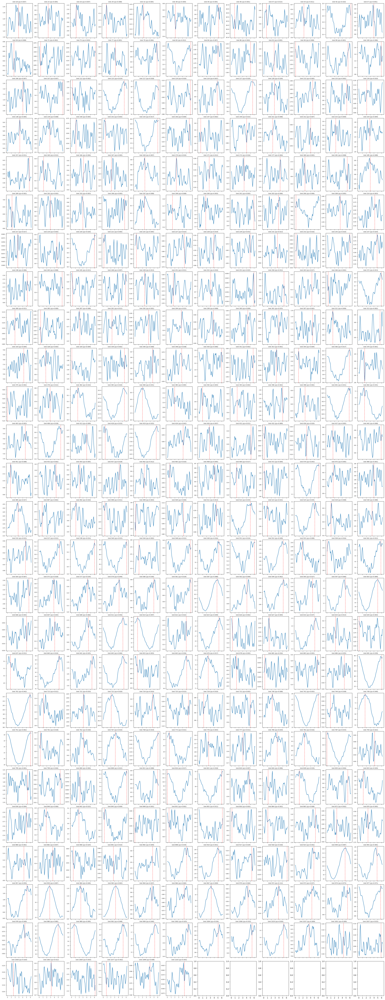

In [208]:
bins = phase_mod.coords['gamma_phase'].values
cols = 12 
rows = np.ceil(len(z)/12).astype(int)

fig, axs = plt.subplots(rows, cols, figsize=(30, 3*rows), sharey=False, sharex=True, constrained_layout=True)

for idx, uid in enumerate(phase_mod.coords['unit'].values):
    row = idx // cols
    col = idx % cols
    ax = axs[row, col]
    ax.plot(bins, smoothed[idx])
    ax.axvline(np.angle(z[idx]) % (2 * np.pi), color='r', linestyle='--', alpha=0.6)
    ax.set_title(f'Unit {uid} (|z|={np.abs(z[idx]):.3f})', fontsize=8)
    ax.tick_params(axis='both', labelsize=6)

### Threshold

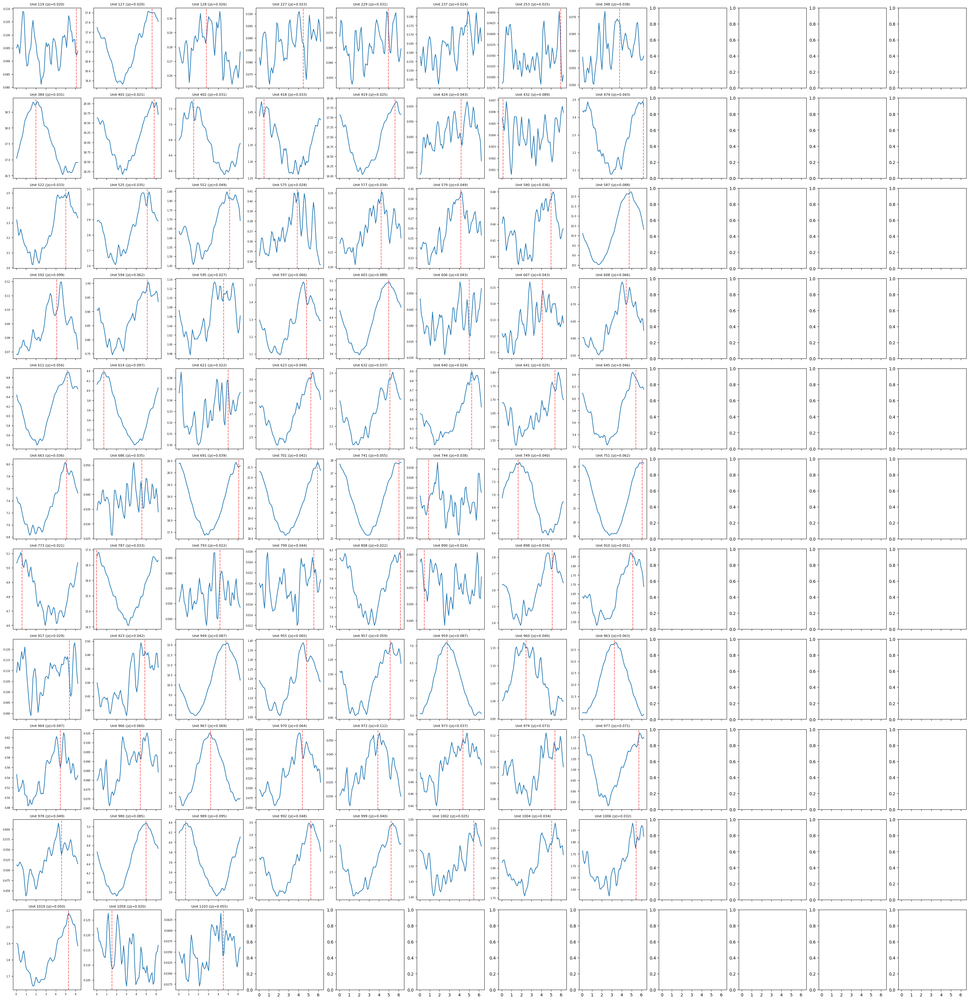

In [231]:
threshold = 0.2
mask = z_length > 0.02
units = phase_mod.coords['unit'].values[mask]

col = 8
rows = np.ceil(len(units)/col).astype(int)
bins = phase_mod.coords['gamma_phase'].values

fig, axs = plt.subplots(rows, cols, figsize=(32, 3*rows), sharey=False, sharex=True, constrained_layout=True)

z_length_ = z_length[mask]
z_angle_ = z_angle[mask]
smoothed_ = smoothed[mask]

for idx, uid in enumerate(units):
    row = idx // col
    col_idx = idx % col
    ax = axs[row, col_idx]

    ax.plot(bins, smoothed_[idx])
    ax.axvline(z_angle_[idx], color='r', linestyle='--', alpha=0.6)
    ax.set_title(f'Unit {uid} (|z|={z_length_[idx]:.3f})', fontsize=8)
    ax.tick_params(axis='both', labelsize=6)